# <font color=navy> MNSY - Project - Phase III
</font>

### <font color=navy> MNSY Team Member </font>

Maliha Tahir - tahir.maliha@baruchmail.cuny.edu <br>
Nat Sierra-Vargas - nsierravargas@baruchmail.cuny.edu <br>
Samuel Malec - samuel.malec@baruchmail.cuny.edu <br>
Yijia Cai - yijia.cai@baruchmail.cuny.edu

## <font color=navy> Business Case </font>
Flexible hotel policies create difficulty for management in forecasting revenue and apportioning resources. The policies incentivize customers, along with the easy to do so over the internet, to cancel and re-book their reservations as late as 24-hours to checking-in without incurring any fees. These vacancies create a loss in revenue and put pressure on management to fill empty rooms, which often leads to lowering prices. 

The scope of the project is to ascertain key revenue drivers in Portugal’s hospitality sector both from international and domestic bookings. The project will sample data from two hotels, a resort in the region of Algarve and a hotel in the city of Lisbon to build a predictive model to determine the likelihood of cancellations on existing bookings by examining predictor variables. The model will delve deeper into each observation with corresponding attributes including previous cancellations, lead time, booking changes, nationality, type of meals, family friendly, deposit, lead time, etc. 

By analyzing the available data, and integrating seasonal weather conditions, we believe we can predict when cancellations are likely to occur. This will help hotel management determine when it will be a good time to increase their promotional offerings in booking websites to minimize the vacancy of their guest spaces.   

In [2]:
import os
import seaborn as sns
from pathlib import Path

import statsmodels.formula.api as sm
import matplotlib.pylab as plt

import plotly.graph_objects as go
import plotly.express as px

from dmba import regressionSummary, exhaustive_search
from dmba import backward_elimination, forward_selection, stepwise_selection
from dmba import adjusted_r2_score, AIC_score, BIC_score

%matplotlib inline
import os
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso, Ridge, LassoCV, BayesianRidge
from sklearn import metrics
import matplotlib.pylab as plt
from dmba import plotDecisionTree, classificationSummary, regressionSummary
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, classification_report

from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB

from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LogisticRegression, RidgeClassifier, SGDClassifier
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler, MinMaxScaler

from xgboost import XGBClassifier

from keras.losses import BinaryCrossentropy
from keras.models import Sequential
from keras.layers import Dense

%load_ext autoreload
%autoreload 2

## <font color=navy> Data Exploration 
</font>

In [6]:
# path = '/Users/Samo88/Documents'
# os.chdir(path)
bookings = pd.read_csv("hotel_bookings_weather_RAW.csv")
bookings.head(2)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,date,maxtempC,mintempC,FeelsLikeC,humidity,precipMM
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,0,0,Check-Out,7/1/2015,2015-07-01,23,18,20,77,0.0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,0,0,Check-Out,7/1/2015,2015-07-01,23,18,20,77,0.0


In [8]:
bookings['deposit_type'].value_counts()

No Deposit    104641
Non Refund     14587
Refundable       162
Name: deposit_type, dtype: int64

In [82]:
bookings.isnull().values.any()

True

In [83]:
bookings.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,...,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,maxtempC,mintempC,FeelsLikeC,humidity,precipMM
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,...,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,...,189.266735,2.321149,101.831122,0.062518,0.571363,21.686649,14.243555,17.268641,70.807597,0.751893
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,...,131.655015,17.594721,50.535790,0.245291,0.792798,5.089546,3.295146,4.639776,9.762475,1.947239
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,6.000000,0.000000,-6.380000,0.000000,0.000000,10.000000,2.000000,3.000000,35.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,...,62.000000,0.000000,69.290000,0.000000,0.000000,17.000000,12.000000,14.000000,65.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,...,179.000000,0.000000,94.575000,0.000000,0.000000,22.000000,15.000000,18.000000,72.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,...,270.000000,0.000000,126.000000,0.000000,1.000000,25.000000,17.000000,21.000000,78.000000,0.300000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,...,543.000000,391.000000,5400.000000,8.000000,5.000000,36.000000,22.000000,29.000000,95.000000,17.300000


##### <font color=red>NOTE:</font>
> Our group has integrated the weather in Lisbon to the entire dataset by date in order to measure the influence of the external variable towards cancellations. The weather in Algarve was not available, however, the two hotels are in close location proximity of one another. 

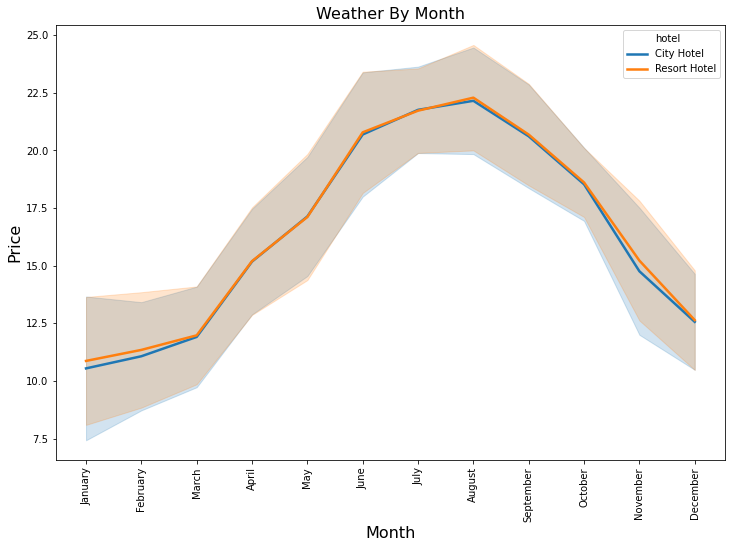

In [3]:
room_prices_mothly = bookings[["hotel", "arrival_date_month", "FeelsLikeC"]].sort_values("arrival_date_month")

# order by month:
ordered_months = ["January", "February", "March", "April", "May", "June", 
                  "July", "August", "September", "October", "November", "December"]
room_prices_mothly["arrival_date_month"] = pd.Categorical(room_prices_mothly["arrival_date_month"], categories=ordered_months, ordered=True)

# barplot with standard deviation:
plt.figure(figsize=(12, 8))
sns.lineplot(x = "arrival_date_month", y="FeelsLikeC", hue="hotel", data=room_prices_mothly, 
            hue_order = ["City Hotel", "Resort Hotel"], ci="sd", size="hotel", sizes=(2.5, 2.5))
plt.title("Weather By Month", fontsize=16)
plt.xlabel("Month", fontsize=16)
plt.xticks(rotation=90)
plt.ylabel("Price", fontsize=16)
plt.show()

In [4]:
bookings.drop(columns=['date'],inplace=True)
bookings.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

In [5]:
bookings.dropna(subset=['country'], how='all', inplace=True)
bookings.dropna(subset=['children'], how='all', inplace=True)
bookings.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               0
babies                                 0
meal                                   0
country                                0
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16004
company         

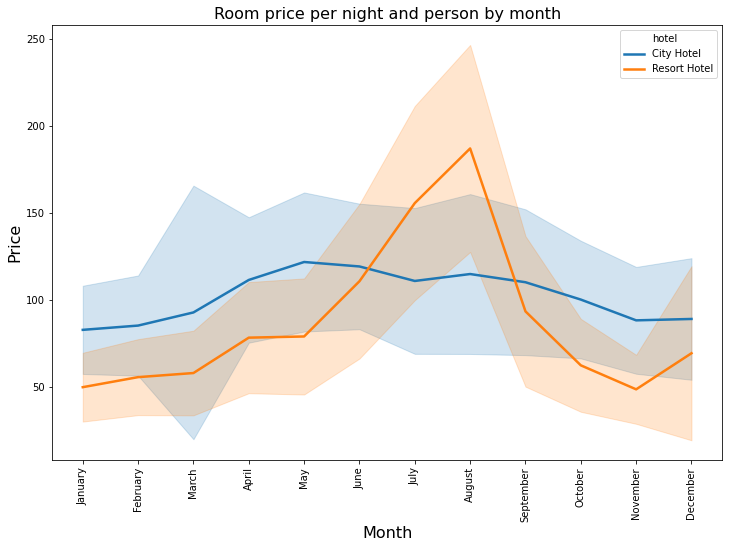

In [6]:
room_prices_mothly = bookings[["hotel", "arrival_date_month", "adr"]].sort_values("arrival_date_month")

# order by month:
ordered_months = ["January", "February", "March", "April", "May", "June", 
          "July", "August", "September", "October", "November", "December"]
room_prices_mothly["arrival_date_month"] = pd.Categorical(room_prices_mothly["arrival_date_month"], categories=ordered_months, ordered=True)

# barplot with standard deviation:
plt.figure(figsize=(12, 8))
sns.lineplot(x = "arrival_date_month", y="adr", hue="hotel", data=room_prices_mothly, 
            hue_order = ["City Hotel", "Resort Hotel"], ci="sd", size="hotel", sizes=(2.5, 2.5))
plt.title("Room price per night and person by month", fontsize=16)
plt.xlabel("Month", fontsize=16)
plt.xticks(rotation=90)
plt.ylabel("Price", fontsize=16)
plt.show()

In [6]:
bookings.drop(columns=['arrival_date_week_number','children','babies','distribution_channel','previous_cancellations','previous_bookings_not_canceled','agent','company','reservation_status', 'reservation_status_date','maxtempC', 'mintempC','humidity'],inplace=True)
bookings.dtypes

hotel                           object
is_canceled                      int64
lead_time                        int64
arrival_date_year                int64
arrival_date_month              object
arrival_date_day_of_month        int64
stays_in_weekend_nights          int64
stays_in_week_nights             int64
adults                           int64
meal                            object
country                         object
market_segment                  object
is_repeated_guest                int64
reserved_room_type              object
assigned_room_type              object
booking_changes                  int64
deposit_type                    object
days_in_waiting_list             int64
customer_type                   object
adr                            float64
required_car_parking_spaces      int64
total_of_special_requests        int64
FeelsLikeC                       int64
precipMM                       float64
dtype: object

<li> Converting variables to numeric form using label encoder <br>

In [7]:
labelencoder = LabelEncoder()
bookings['country'] = labelencoder.fit_transform(bookings['country'].astype(str))
bookings['hotel'] = labelencoder.fit_transform(bookings['hotel'])
bookings['arrival_date_month'] = labelencoder.fit_transform(bookings['arrival_date_month'].astype(str))
bookings['meal'] = labelencoder.fit_transform(bookings['meal'])
bookings['market_segment']= labelencoder.fit_transform(bookings['market_segment'])
bookings['is_repeated_guest'] = labelencoder.fit_transform(bookings['is_repeated_guest'])
bookings['reserved_room_type'] = labelencoder.fit_transform(bookings['reserved_room_type'])
bookings['assigned_room_type'] = labelencoder.fit_transform(bookings['assigned_room_type'])
bookings['deposit_type'] = labelencoder.fit_transform(bookings['deposit_type'])
bookings['customer_type'] = labelencoder.fit_transform(bookings['customer_type'])
bookings.dtypes

hotel                            int32
is_canceled                      int64
lead_time                        int64
arrival_date_year                int64
arrival_date_month               int32
arrival_date_day_of_month        int64
stays_in_weekend_nights          int64
stays_in_week_nights             int64
adults                           int64
meal                             int32
country                          int32
market_segment                   int32
is_repeated_guest                int64
reserved_room_type               int32
assigned_room_type               int32
booking_changes                  int64
deposit_type                     int32
days_in_waiting_list             int64
customer_type                    int32
adr                            float64
required_car_parking_spaces      int64
total_of_special_requests        int64
FeelsLikeC                       int64
precipMM                       float64
dtype: object

In [8]:
bookings['is_canceled'] = bookings['is_canceled'].astype('category')

In [89]:
bookings.dtypes

hotel                             int32
is_canceled                    category
lead_time                         int64
arrival_date_year                 int64
arrival_date_month                int32
arrival_date_day_of_month         int64
stays_in_weekend_nights           int64
stays_in_week_nights              int64
adults                            int64
meal                              int32
country                           int32
market_segment                    int32
is_repeated_guest                 int64
reserved_room_type                int32
assigned_room_type                int32
booking_changes                   int64
deposit_type                      int32
days_in_waiting_list              int64
customer_type                     int32
adr                             float64
required_car_parking_spaces       int64
total_of_special_requests         int64
FeelsLikeC                        int64
precipMM                        float64
dtype: object

In [22]:
pip install plotly==4.13.0

Note: you may need to restart the kernel to use updated packages.


In [31]:
bookings.replace({-1 : 0, 1 : 1}, inplace = True)
bookings1 = bookings.loc[bookings.is_canceled == 0, :].copy()

countries = pd.DataFrame(bookings1[['adults', 'country']].groupby(bookings1['country'])['adults'].sum())

print ("Total Countries in the dataset : ", bookings['country'].nunique())

fig = px.pie(countries, values = 'adults', names = countries.index, title = 'Total Number of guest from different countries whose bookings are not canceled')
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

Total Countries in the dataset :  177


In [177]:
world_map = px.choropleth(countries,
                    locations = countries.index,
                    color = 'adults', 
                    hover_name = countries.index, 
                    color_continuous_scale = px.colors.sequential.Sunsetdark,
                    title = "Total Number of Guests from Different Countries on World Map")

world_map.update_geos(fitbounds = "locations", visible = False)

world_map.show()

## <font color=navy> Frequency of Target Variable </font>

In [8]:
print(bookings['is_canceled'].dtypes)
print(bookings['is_canceled'].value_counts())

category
0    74745
1    44153
Name: is_canceled, dtype: int64


In [9]:
print(bookings['deposit_type'].value_counts())

0    104163
1     14573
2       162
Name: deposit_type, dtype: int64


Distribution of the hotel based on the booking status

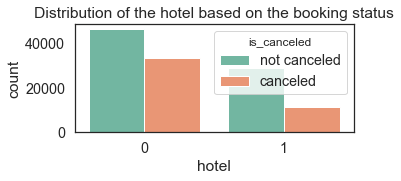

In [13]:
plt.rcParams['figure.figsize'] = [20, 7]
sns.set(style = 'white', font_scale = 1.3)

bookings['is_canceled'].replace({1: 'canceled', 0: 'not canceled'}, inplace = True)

dist = sns.countplot(bookings['hotel'], hue = 'is_canceled', data = bookings, palette = 'Set2');

dist.set(title = "Distribution of the hotel based on the booking status");

> ##### <font color=red>NOTE:</font>
> Across the three year data, resort hotel has a cancellation rate of 30.76% and city hotel has a higher cancellation rate of 42%

Number of Reservations per year (months)

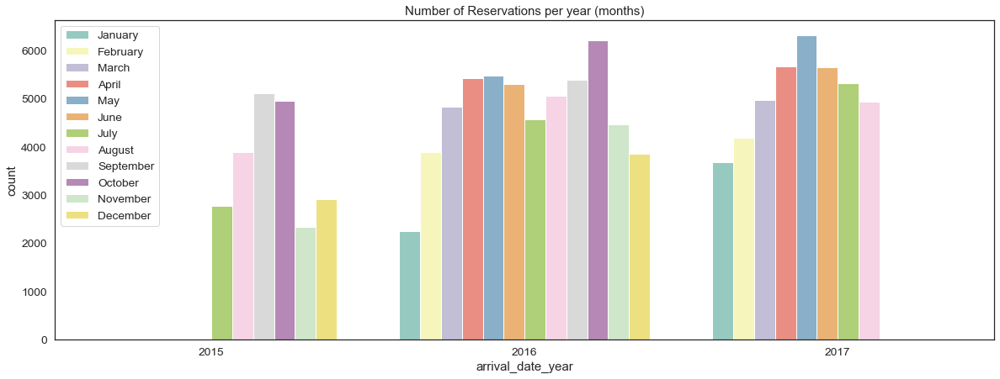

In [19]:
plt.rcParams['figure.figsize'] = [20, 7]
sns.set(style = 'white', font_scale = 1.25)


arrival = sns.countplot(bookings['arrival_date_year'], hue = 'arrival_date_month', data = bookings, palette = 'Set3',
             hue_order = ['January', 'February', 'March', 'April', 'May', 'June',
                          'July', 'August', 'September', 'October', 'November', 'December'])
arrival.set(title = "Number of Reservations per year (months)")
plt.legend(loc='upper left');

Cancellation Status per year

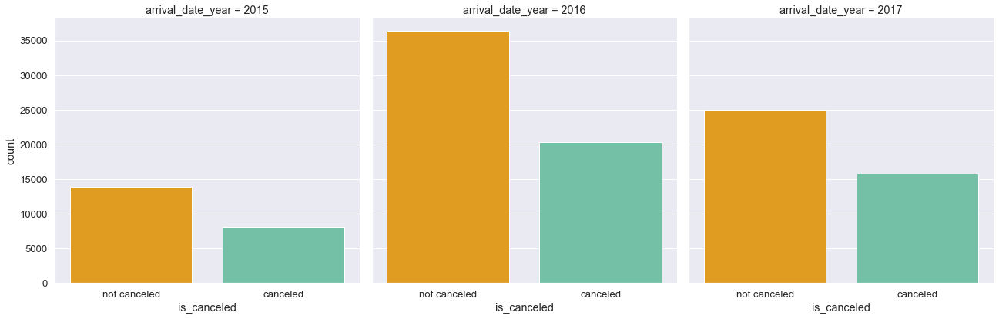

In [20]:
plt.rcParams['figure.figsize'] = [15, 7]
sns.set(style = 'darkgrid', font_scale = 1.2)

cat = sns.catplot(x = 'is_canceled', col = 'arrival_date_year', kind = 'count', data = bookings,
            height = 6, palette = ['orange', 'mediumaquamarine', 'darkgrey']);

##### <font color=red>NOTE:</font>
> The cancellation rate for both resort hotel and city hotel are 38%, 35.8% and 38.6% for 2015, 2016 and 2017 respectively. According to an article published by Hospitality Technology published in April 2019 that hotel cancellation rate has been steadily increasing and reached 40% on average by 2018. Although it appears that there is a high cancellation rate in our data set, it is compatiable with the industry average.

## <font color=navy> Missing Values & Duplicates </font>

In [92]:
duplicates = bookings.duplicated()
bookings[duplicates].count()

hotel                          32407
is_canceled                    32407
lead_time                      32407
arrival_date_year              32407
arrival_date_month             32407
arrival_date_day_of_month      32407
stays_in_weekend_nights        32407
stays_in_week_nights           32407
adults                         32407
meal                           32407
country                        32407
market_segment                 32407
is_repeated_guest              32407
reserved_room_type             32407
assigned_room_type             32407
booking_changes                32407
deposit_type                   32407
days_in_waiting_list           32407
customer_type                  32407
adr                            32407
required_car_parking_spaces    32407
total_of_special_requests      32407
FeelsLikeC                     32407
precipMM                       32407
dtype: int64

> ##### <font color=red>NOTE:</font>
> We will not eliminate duplicate data. Because the dataset does not have a unique ID per entry; we will work under the assumption that these were separate interactions for our regression models.

## <font color=navy> Important Variables</font>

#### <font color=black> adr - average daily rate </font>

In [93]:
Q1 = bookings.quantile(0.25)
Q3 = bookings.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

hotel                            1.0
lead_time                      143.0
arrival_date_year                1.0
arrival_date_month               6.0
arrival_date_day_of_month       15.0
stays_in_weekend_nights          2.0
stays_in_week_nights             2.0
adults                           0.0
meal                             0.0
country                         79.0
market_segment                   2.0
is_repeated_guest                0.0
reserved_room_type               3.0
assigned_room_type               3.0
booking_changes                  0.0
deposit_type                     0.0
days_in_waiting_list             0.0
customer_type                    0.0
adr                             56.0
required_car_parking_spaces      0.0
total_of_special_requests        1.0
FeelsLikeC                       7.0
precipMM                         0.3
dtype: float64


#### <font color=black> Resort Hotel - adr variable details </font>

In [9]:
resort_adr=bookings[bookings['hotel']==1]['adr']
resort_adr.describe()

count    39596.000000
mean        95.347555
std         61.495116
min         -6.380000
25%         50.500000
50%         76.000000
75%        125.617500
max        508.000000
Name: adr, dtype: float64

#### <font color=black> City Hotel - adr variable details </font>

In [10]:
city_adr=bookings[bookings['hotel']==0]['adr']
city_adr.describe()

count    79302.000000
mean       105.326470
std         43.590608
min          0.000000
25%         79.200000
50%         99.900000
75%        126.000000
max       5400.000000
Name: adr, dtype: float64

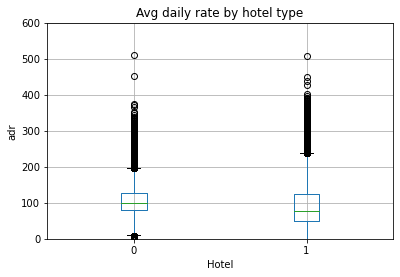

In [11]:
ax1 = bookings.boxplot(column='adr', by='hotel')
ax1.set_ylabel('adr')
ax1.set_xlabel('Hotel')
ax1.set(ylim=(0, 600))
plt.suptitle('')  # Suppress the titles
plt.title('Avg daily rate by hotel type')
plt.show()

## <font color=navy> Outliers </font>

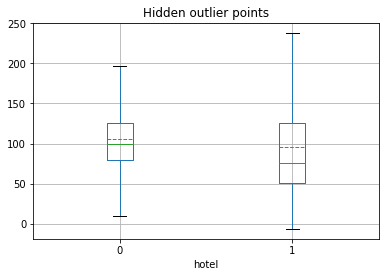

In [52]:
ax2=bookings.boxplot(column='adr', by='hotel',showmeans=True, meanline=True,showfliers=False)
ax2.set_title('Hide Outlier Points')
plt.suptitle('')  # Suppress the titles
plt.title('Hidden outlier points')
plt.show()

In [12]:
city_adr_min=32 #Q1-(Q3-Q1)
city_adr_max=196 #Q3+1.5(Q3-Q1)
resort_adr_min=20 #mean-(Q3-Q1)
resort_adr_max=238 #Q3+1.5(Q3-Q1)

bookings.loc[(bookings['hotel']==0) & (bookings['adr']<city_adr_min) , 'adr'] = city_adr_min
bookings.loc[(bookings['hotel']==0) & (bookings['adr']>city_adr_max) , 'adr'] = city_adr_max
bookings.loc[(bookings['hotel']==1) & (bookings['adr']<resort_adr_min) , 'adr'] = resort_adr_min
bookings.loc[(bookings['hotel']==1) & (bookings['adr']>resort_adr_max) , 'adr'] = resort_adr_max

city_adr=bookings[bookings['hotel']==0]['adr']
city_adr.describe()

count    79302.000000
mean       105.017301
std         35.495769
min         32.000000
25%         79.200000
50%         99.900000
75%        126.000000
max        196.000000
Name: adr, dtype: float64

In [13]:
resort_adr=bookings[bookings['hotel']==1]['adr']
resort_adr.describe()

count    39596.000000
mean        94.617490
std         57.457256
min         20.000000
25%         50.500000
50%         76.000000
75%        125.617500
max        238.000000
Name: adr, dtype: float64

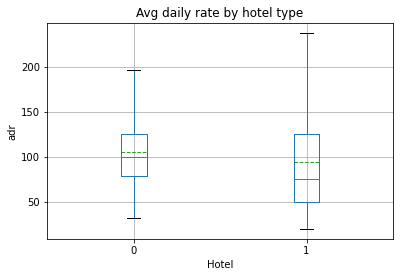

In [14]:
ax3 = bookings.boxplot(column='adr', by='hotel',showmeans=True, meanline=True)
ax3.set_ylabel('adr')
ax3.set_xlabel('Hotel')
plt.suptitle('')  # Suppress the titles
plt.title('Avg daily rate by hotel type')
plt.show()

## <font color=navy> Correlation Matrix </font>

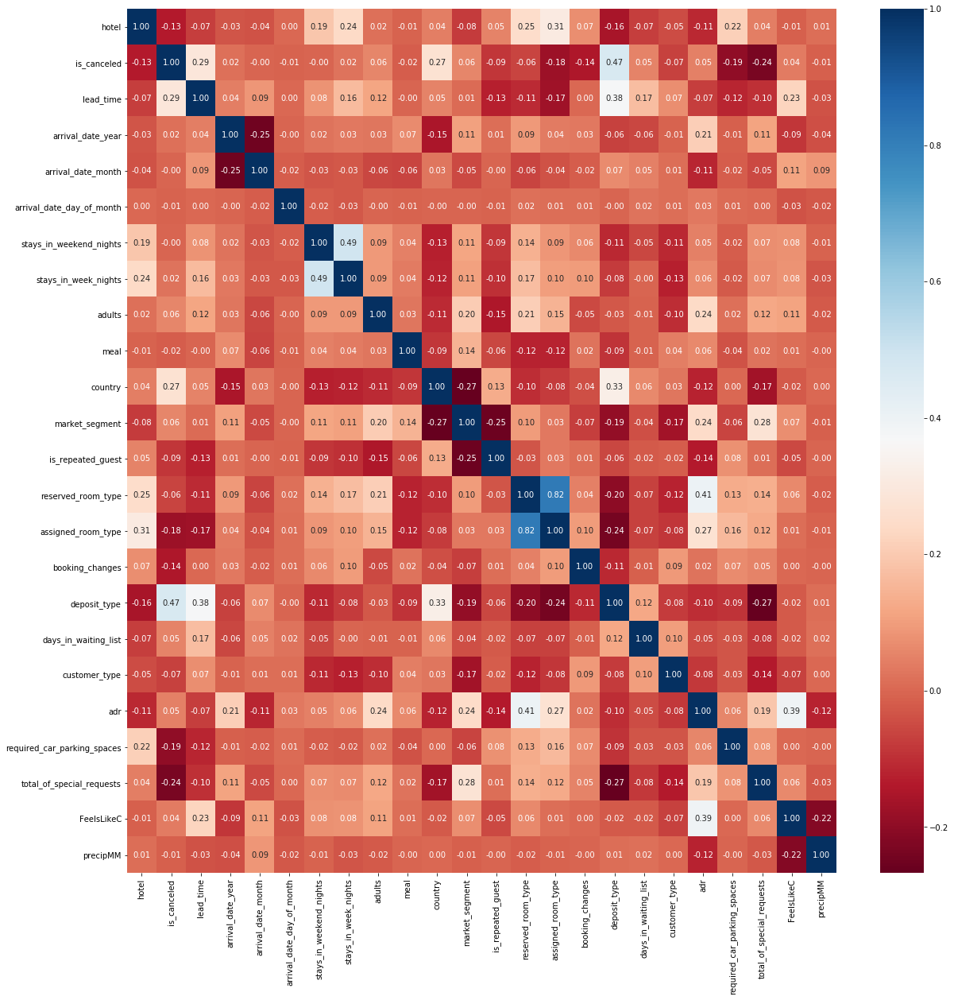

The Initial dataframe has 24 columns.


In [187]:
corr = bookings.corr()

fig, ax = plt.subplots()
fig.set_size_inches(20, 20)
sns.heatmap(corr, annot=True, fmt=".2f", cmap="RdBu", ax=ax)
plt.show()

print("The Initial dataframe has {} columns.".format(bookings.shape[1]))

> ##### <font color=red>NOTE:</font>
>The correlation matrix shows that features reserved_room_type and assigned_room_type have a high correlation of 0.82. In order to prevent multicollinearity, where one predictor variable can be linearly predicted from the other features with a high degree of accuracy and by doing so skewing or misleading results, we automated the removal of highly correlated features; those with values 0.8 and higher. 

### <font color=Navy> * *Removing Highly Correlated Features* *</font>

In [15]:
# Calculate the correlation matrix and take the absolute value
corr_matrix = bookings.corr()

# Create a True/False mask and apply it
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
tri_df = corr_matrix.mask(mask)

# List column names of highly correlated features (r > 0.8)
to_drop = [c for c in tri_df.columns if any(tri_df[c] >  0.8)]

# Drop the features in the to_drop list
bookings = bookings.drop(to_drop, axis=1)

print("The reduced dataframe has {} columns.".format(bookings.shape[1]))

The reduced dataframe has 23 columns.


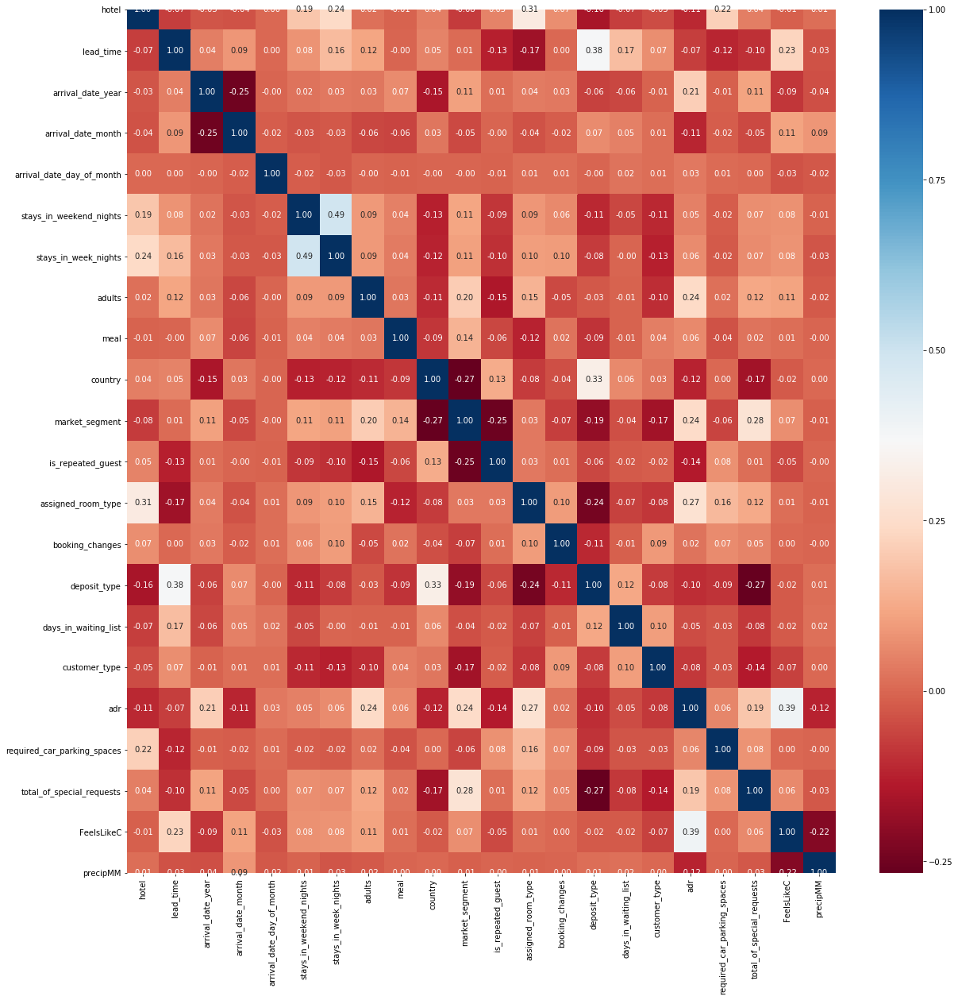

In [57]:
corr = bookings.corr()

fig, ax = plt.subplots()
fig.set_size_inches(20, 20)
sns.heatmap(corr, annot=True, fmt=".2f", cmap="RdBu", ax=ax)
plt.show()

>##### <font color=red>NOTE:</font>
>The resulting new dataframe comprises 23 low correlated columns, with a max correlation of 0.49. <br>

## <font color=navy> Scatterplots </font>

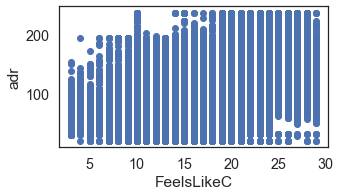

In [21]:
fig, ax = plt.subplots()
fig.set_size_inches(5, 3)

ax.scatter(bookings['FeelsLikeC'], bookings['adr'])
plt.xlabel('FeelsLikeC')
plt.ylabel('adr')

plt.tight_layout()
plt.show()

> ##### <font color=red>NOTE:</font>
> Average daily rate of rooms for both city hotel and resort hotel shows a positive linear relation as the temperature goes higher in Portugal. 

## <font color=navy> Identifying a Baseline Model </font>

In [16]:
predictors = bookings.drop(columns=['is_canceled'])
outcome= bookings['is_canceled']
X=predictors
y=outcome

# created temporary training and final testing data set
X_temp, X_test, y_temp, y_test  =\
    train_test_split(X, y, test_size=.3, random_state=1)

# created final training and validation datasets
train_X, valid_X, train_y, valid_y =\
    train_test_split(X_temp, y_temp, test_size=0.3, random_state=1)

### <font color=black> **Descision Tree**</font>
Using grid search to find optimized tree.

In [27]:
param_grid = {
    'max_depth': [i for i in range(0,20,1)], 
    'min_impurity_decrease': [0, 0.001, 0.002, 0.003, 0.005, 0.006, 0.007, 0.008],
    'min_samples_split': [14, 15, 16, 18, 20, ], 
}
gridSearch = GridSearchCV(DecisionTreeRegressor(), param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_X, train_y)
print('Best parameters: ', gridSearch.best_params_)

regTree = gridSearch.best_estimator_

Best parameters:  {'max_depth': 12, 'min_impurity_decrease': 0, 'min_samples_split': 20}


In [28]:

DecisionTree = DecisionTreeClassifier(max_depth = 12)
scores = cross_val_score(DecisionTree, train_X, train_y, cv=5)
DecisionTree.fit(train_X, train_y)

plotDecisionTree(DecisionTree, feature_names=train_X.columns, rotate=True)

#### <font color=black> Accuracy Score, Precision, Recall, & F1-Score </font>

In [29]:
prediction_train = DecisionTree.predict(train_X)
prediction_valid = DecisionTree.predict(valid_X)

def report(DecisionTree, train_X, train_y, valid_X, valid_y):
    prediction_train = DecisionTree.predict(train_X)
    prediction_valid = DecisionTree.predict(valid_X)

    # Measure the accuracy of the model for both train and test sets
    print("Accuracy on train is:",accuracy_score(train_y,prediction_train)*100,'%')
    print('')
    print("Accuracy on Valid is:",accuracy_score(valid_y,prediction_valid)*100,'%')
    
report(DecisionTree, train_X, train_y, valid_X, valid_y)

print('')
print(classification_report(valid_y,prediction_valid))

Accuracy on train is: 85.69148114454418 %

Accuracy on Valid is: 84.076254555649 %

              precision    recall  f1-score   support

           0       0.87      0.88      0.87     15697
           1       0.80      0.77      0.78      9272

    accuracy                           0.84     24969
   macro avg       0.83      0.83      0.83     24969
weighted avg       0.84      0.84      0.84     24969



In [30]:
#testing on unseen data
DT_test = DecisionTree.predict(X_test)
print("Accuracy on Unseen Test set is:",accuracy_score(y_test, DT_test))
print()
print("Unseen Test set")
print(classification_report(y_test, DT_test))

Accuracy on Unseen Test set is: 0.8392767031118588

Unseen Test set
              precision    recall  f1-score   support

           0       0.87      0.88      0.87     22468
           1       0.79      0.77      0.78     13202

    accuracy                           0.84     35670
   macro avg       0.83      0.82      0.83     35670
weighted avg       0.84      0.84      0.84     35670



#### <font color=black> Feature Importance </font>

In [31]:
importances = DecisionTree.feature_importances_
df = pd.DataFrame({'feature': train_X.columns, 'importance (low to high)': importances})
df = df.sort_values('importance (low to high)', ascending=True)
print(df)

                        feature  importance (low to high)
11            is_repeated_guest                  0.001153
8                          meal                  0.002726
15         days_in_waiting_list                  0.003374
7                        adults                  0.003482
5       stays_in_weekend_nights                  0.004334
21                     precipMM                  0.004360
4     arrival_date_day_of_month                  0.005319
6          stays_in_week_nights                  0.005364
20                   FeelsLikeC                  0.005894
12           assigned_room_type                  0.006856
0                         hotel                  0.006921
3            arrival_date_month                  0.011158
16                customer_type                  0.022518
13              booking_changes                  0.025095
17                          adr                  0.029127
2             arrival_date_year                  0.035228
18  required_c

### <font color=black> **Logistic Regression** </font>

In [15]:
logreg = LogisticRegression(solver='liblinear')
logreg.fit(train_X, train_y)

LogisticRegression(solver='liblinear')

#### <font color=black> Accuracy Score, Precision, Recall, & F1-Score </font>

In [16]:
prediction_trainlr = logreg.predict(train_X)
prediction_validlr = logreg.predict(valid_X)

def report(logreg, train_X, train_y, valid_X, valid_y):
    prediction_trainlr = logreg.predict(train_X)
    prediction_validlr = logreg.predict(valid_X)

    # Measure the accuracy of the model for both train and test sets
    print('')
    print("Accuracy on train is: ", accuracy_score(train_y,prediction_trainlr))
    print('')
    print("Accuracy on Valid is: ", accuracy_score(valid_y,prediction_validlr))
    print('')
report(logreg, train_X, train_y, valid_X, valid_y)

print(classification_report(valid_y, prediction_validlr))


Accuracy on train is:  0.781235517259136

Accuracy on Valid is:  0.7787656694300933

              precision    recall  f1-score   support

           0       0.78      0.91      0.84     15697
           1       0.79      0.55      0.65      9272

    accuracy                           0.78     24969
   macro avg       0.78      0.73      0.74     24969
weighted avg       0.78      0.78      0.77     24969



#### <font color=black> Feature Importance </font>

In [17]:
print('')
print('intercept: ', logreg.intercept_[0])
print('')
df=pd.DataFrame({'coeff (low to high)': logreg.coef_[0]}, index=X.columns)
df = df.sort_values('coeff (low to high)', ascending=True)
print(df)


intercept:  -0.0018036691334668079

                             coeff (low to high)
required_car_parking_spaces            -2.677139
total_of_special_requests              -0.671591
booking_changes                        -0.416479
customer_type                          -0.202036
is_repeated_guest                      -0.170383
assigned_room_type                     -0.134409
hotel                                  -0.089776
meal                                   -0.047526
FeelsLikeC                             -0.035026
precipMM                               -0.014589
arrival_date_month                     -0.014346
days_in_waiting_list                   -0.006281
arrival_date_day_of_month              -0.002983
arrival_date_year                      -0.002076
lead_time                               0.004196
adr                                     0.009525
country                                 0.012129
stays_in_weekend_nights                 0.041708
stays_in_week_nights            

### <font color=black> **Logistic Regression CV** </font>

In [18]:
lr = LogisticRegression(solver='liblinear')
lr.fit(train_X, train_y)
scores = cross_val_score(lr, train_X, train_y, cv=5)
lr_pred = lr.predict(valid_X)

#### <font color=black> Accuracy Score, Precision, Recall, & F1-Score </font>

In [19]:
print('')
print("Average cross validation score: {:.3f}".format(scores.mean()))
print('')
print("Valid accuracy: {:.3f}".format(lr.score(valid_X, valid_y)))
print('')
print(classification_report(valid_y,lr_pred))


Average cross validation score: 0.781

Valid accuracy: 0.779

              precision    recall  f1-score   support

           0       0.78      0.91      0.84     15697
           1       0.79      0.55      0.65      9272

    accuracy                           0.78     24969
   macro avg       0.78      0.73      0.74     24969
weighted avg       0.78      0.78      0.77     24969



In [28]:
#testing on unseen data
Log_test = logreg.predict(X_test)

print("Accuracy on Unseen Test set is:",accuracy_score(y_test, Log_test))
print()
print("Unseen Test set")
print(classification_report(y_test, Log_test))

Accuracy on Unseen Test set is: 0.777179702831511

Unseen Test set
              precision    recall  f1-score   support

    canceled       0.79      0.55      0.65     13202
not canceled       0.77      0.91      0.84     22468

    accuracy                           0.78     35670
   macro avg       0.78      0.73      0.74     35670
weighted avg       0.78      0.78      0.77     35670



#### <font color=black> Feature Importance </font>

In [29]:
print('')
print('intercept: ', lr.intercept_[0])
print('')
df=pd.DataFrame({'coeff (low to high)': lr.coef_[0]}, index=X.columns)
df = df.sort_values('coeff (low to high)', ascending=True)
print(df)


intercept:  0.0022875513783157456

                             coeff (low to high)
deposit_type                           -3.662259
market_segment                         -0.420810
adults                                 -0.235788
stays_in_weekend_nights                -0.051859
stays_in_week_nights                   -0.040292
country                                -0.012086
adr                                    -0.009516
lead_time                              -0.004158
arrival_date_year                       0.002089
arrival_date_day_of_month               0.002997
days_in_waiting_list                    0.006330
precipMM                                0.012256
arrival_date_month                      0.015450
FeelsLikeC                              0.034310
meal                                    0.042699
hotel                                   0.070624
assigned_room_type                      0.133242
is_repeated_guest                       0.159769
customer_type                    

### <font color=black> **Logistic Regression with scaled data** </font>

In [20]:
std_scaler = StandardScaler()
std_scaler.fit(train_X)
train_X_std = std_scaler.transform(train_X)
valid_X_std = std_scaler.transform(valid_X)

mm_scaler = MinMaxScaler()
mm_scaler.fit(train_X)
train_X_mm = mm_scaler.transform(train_X)
valid_X_mm = mm_scaler.transform(valid_X)

logreg2 = LogisticRegression(max_iter=500).fit(train_X_mm, train_y)
scores = cross_val_score(logreg2, train_X_mm, train_y, cv=5)
logreg2_pred = logreg.predict(valid_X_mm)

#### <font color=black> Accuracy Score, Precision, Recall, & F1-Score </font>

In [21]:
print('')
print("Average cross validation score: {:.3f}".format(scores.mean()))
print('')
print("Valid accuracy: {:.3f}".format(logreg2.score(valid_X_mm, valid_y)))
print('')
print(classification_report(valid_y,logreg2_pred))


Average cross validation score: 0.778

Valid accuracy: 0.777

              precision    recall  f1-score   support

           0       0.84      0.44      0.58     15697
           1       0.48      0.86      0.61      9272

    accuracy                           0.60     24969
   macro avg       0.66      0.65      0.60     24969
weighted avg       0.70      0.60      0.59     24969



#### <font color=black> Feature Importance </font>

In [22]:
print('')
print('intercept: ', logreg2.intercept_[0])
print('')
df=pd.DataFrame({'coeff (low to high)': logreg2.coef_[0]}, index=X.columns)
df = df.sort_values('coeff (low to high)', ascending=True)
print(df)


intercept:  -4.069632998794377

                             coeff (low to high)
required_car_parking_spaces           -17.869834
booking_changes                        -7.587571
total_of_special_requests              -3.299903
days_in_waiting_list                   -2.149229
assigned_room_type                     -1.384228
FeelsLikeC                             -0.772618
customer_type                          -0.610213
is_repeated_guest                      -0.180624
precipMM                               -0.179707
meal                                   -0.170564
arrival_date_month                     -0.134361
hotel                                  -0.099209
arrival_date_day_of_month              -0.088777
arrival_date_year                       0.228953
stays_in_weekend_nights                 0.773502
stays_in_week_nights                    1.697704
adr                                     1.983559
country                                 2.143080
market_segment                      

### <font color=black> **Linear Support Vector Classifier (SVC) using CV** </font>

In [23]:
svc = LinearSVC().fit(train_X_mm, train_y)
scores = cross_val_score(svc, train_X_mm, train_y, cv=5)
svc_pred = svc.predict(valid_X_mm)

#### <font color=black> Accuracy Score, Precision, Recall, & F1-Score </font>

In [24]:
print('')
print("Average cross validation score: {:.3f}".format(scores.mean()))
print('')
print("Valid accuracy: {:.3f}".format(svc.score(valid_X_mm, valid_y)))
print('')
print(classification_report(valid_y,svc_pred))


Average cross validation score: 0.778

Valid accuracy: 0.776

              precision    recall  f1-score   support

           0       0.77      0.92      0.84     15697
           1       0.80      0.53      0.64      9272

    accuracy                           0.78     24969
   macro avg       0.79      0.72      0.74     24969
weighted avg       0.78      0.78      0.76     24969



### **Naive Bayes using CV**

In [25]:
gnb = GaussianNB()
gnb.fit(train_X, train_y)
scores = cross_val_score(gnb, train_X, train_y, cv=5)
gnb_pred = gnb.predict(valid_X)

#### <font color=black> Accuracy Score, Precision, Recall, & F1-Score </font>

In [35]:
print('')
print("Average cross validation score: {:.3f}".format(scores.mean()))
print('')
print("Valid accuracy: {:.3f}".format(gnb.score(valid_X, valid_y)))
print('')
print(classification_report(valid_y,gnb_pred))


Average cross validation score: 0.542

Valid accuracy: 0.540

              precision    recall  f1-score   support

    canceled       0.44      0.93      0.60      9272
not canceled       0.88      0.31      0.46     15697

    accuracy                           0.54     24969
   macro avg       0.66      0.62      0.53     24969
weighted avg       0.72      0.54      0.51     24969



#### <font color=black> gnb important features </font>

In [47]:
print('')
df=pd.DataFrame({'coeff (low to high)': gnb.theta_[1]}, index=X.columns)
df = df.sort_values('coeff (low to high)', ascending=True)
print(df)


                             coeff (low to high)
required_car_parking_spaces             0.000000
is_repeated_guest                       0.011578
booking_changes                         0.100051
hotel                                   0.246229
total_of_special_requests               0.325476
deposit_type                            0.334010
meal                                    0.529222
precipMM                                0.715637
assigned_room_type                      0.878131
stays_in_weekend_nights                 0.917432
adults                                  1.906453
customer_type                           2.084460
stays_in_week_nights                    2.556945
days_in_waiting_list                    3.421376
market_segment                          5.030905
arrival_date_month                      5.473315
arrival_date_day_of_month              15.683196
FeelsLikeC                             17.518428
adr                                   104.360857
country            

#### <font color=black> **XGBOOST** </font>

In [36]:
from xgboost import XGBClassifier

In [37]:
model = XGBClassifier()
model.fit(train_X, train_y)
XG_pred = model.predict(valid_X)

#### <font color=black> Accuracy Score, Precision, Recall, & F1-Score </font>

In [38]:
accuracy = accuracy_score(valid_y, XG_pred)
print('')
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print('')
print(classification_report(valid_y,XG_pred))


Accuracy: 86.20%

              precision    recall  f1-score   support

    canceled       0.84      0.78      0.81      9272
not canceled       0.88      0.91      0.89     15697

    accuracy                           0.86     24969
   macro avg       0.86      0.85      0.85     24969
weighted avg       0.86      0.86      0.86     24969



#### <font color=black> Feature Importance </font>

In [21]:
importances = model.feature_importances_
df = pd.DataFrame({'feature': train_X.columns, 'importance (low to high)': importances})
df = df.sort_values('importance (low to high)', ascending=True)
print(df)

                        feature  importance (low to high)
4     arrival_date_day_of_month                  0.003078
21                     precipMM                  0.003376
20                   FeelsLikeC                  0.003878
6          stays_in_week_nights                  0.004583
3            arrival_date_month                  0.004912
5       stays_in_weekend_nights                  0.005583
17                          adr                  0.005921
8                          meal                  0.006189
7                        adults                  0.006443
12           assigned_room_type                  0.007278
0                         hotel                  0.008207
15         days_in_waiting_list                  0.009492
11            is_repeated_guest                  0.010295
2             arrival_date_year                  0.012637
1                     lead_time                  0.012921
13              booking_changes                  0.015267
16            

> ##### <font color=red> NOTE: </font>
> From the above, the model with the most accurate results was XG Boost.

### <font color=black> **K-Nearest Neighbors** </font>

__KNN requires scaling of data because KNN uses the Euclidean distance between two data points to find nearest neighbors. To prevent features with high magnitudes weighting more than features with low magnitudes__

In [59]:
scaler = StandardScaler().fit(train_X)
# Scale the train set
train_X = scaler.transform(train_X)

# Scale the val set
valid_X = scaler.transform(valid_X)

# Scale the test set
X_test = scaler.transform(X_test)

In [65]:
knn = KNeighborsClassifier(n_neighbors = 8)
knn.fit(train_X, train_y)
y_pred_knn = knn.predict(valid_X)

In [66]:
print(classification_report(valid_y,y_pred_knn))
print(classificationSummary(valid_y,y_pred_knn))

              precision    recall  f1-score   support

           0       0.82      0.92      0.87     15697
           1       0.83      0.66      0.74      9272

    accuracy                           0.82     24969
   macro avg       0.82      0.79      0.80     24969
weighted avg       0.82      0.82      0.82     24969

Confusion Matrix (Accuracy 0.8234)

       Prediction
Actual     0     1
     0 14394  1303
     1  3107  6165
None


#### <font color=black> Cross-Validation for KNN </font>

In [62]:
knn_scores = cross_val_score(knn, X, y, cv=5, scoring='accuracy')
print('scores for each of the 5-folds:', knn_scores)
print('Mean Score of the 5-folds:' , knn_scores.mean())

scores for each of the 5-folds: [0.68591253 0.65403701 0.62863751 0.63804197 0.68013794]
Mean Score of the 5-folds: 0.6573533909159516


#### <font color=black> Choosing a hyperparameter for a k-fold </font>

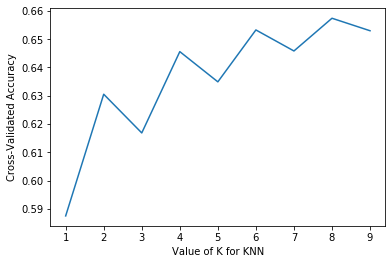

In [63]:
k_range = range(1,10)
k_scores = []

# use iteration to caclulate different k in models, then return the average accuracy based on the cross validation
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn_scores = cross_val_score(knn, X, y, cv=5, scoring='accuracy')
    k_scores.append(knn_scores.mean())

plt.plot(k_range, k_scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Cross-Validated Accuracy')
plt.show()

> ##### <font color=red> NOTE </font>
> Based on the above the best KNN is 8, which results in a 82% accuracy score. At 8, the cross validation accuracy average score levels-off and it becomes computationally heavy.

In [67]:
#testing on unseen data
knn_test = knn.predict(X_test)

print("Accuracy on Unseen Test set is:",accuracy_score(y_test, knn_test))
print()
print("Unseen Test set")
print(classification_report(y_test, knn_test))

Accuracy on Unseen Test set is: 0.8183347350714887

Unseen Test set
              precision    recall  f1-score   support

           0       0.82      0.91      0.86     22468
           1       0.81      0.66      0.73     13202

    accuracy                           0.82     35670
   macro avg       0.82      0.79      0.80     35670
weighted avg       0.82      0.82      0.81     35670



> ##### <font color=red> NOTE </font>
The KNN model generated an accuracy of 82%, but it's recall score was only 66%. The low score would imply that the model's simple architecture of predicting classifications would result in high unexpected cancelations. The model is also computationally heavy, meaning all training points are used in the testing phase. KNN will scan the entire dataset during the training phase searching and classifying based on similar tuples according to the nearest neighbors. The nearest neighbors vote on which class of the prediction.

### <font color=black> **Random Forrest** </font>

In [98]:
rf = RandomForestClassifier(n_estimators=500, random_state=1)
rf.fit(train_X, train_y)

# prediction on test set
y_pred_rf=rf.predict(valid_X)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(valid_y, y_pred_rf))

Accuracy: 0.8756458007929833


#### <font color=black> Feature Importance </font>

                        feature  importance       std
15         days_in_waiting_list    0.002597  0.003053
11            is_repeated_guest    0.002742  0.001242
0                         hotel    0.011479  0.003722
8                          meal    0.014574  0.002622
7                        adults    0.015730  0.003227
18  required_car_parking_spaces    0.022630  0.006970
13              booking_changes    0.023391  0.009347
5       stays_in_weekend_nights    0.023701  0.002344
16                customer_type    0.025102  0.009934
2             arrival_date_year    0.025141  0.003603
21                     precipMM    0.026271  0.001794
12           assigned_room_type    0.031412  0.011289
3            arrival_date_month    0.035677  0.002568
6          stays_in_week_nights    0.037345  0.003354
20                   FeelsLikeC    0.049215  0.002675
4     arrival_date_day_of_month    0.056811  0.002839
19    total_of_special_requests    0.060414  0.019665
10               market_segm

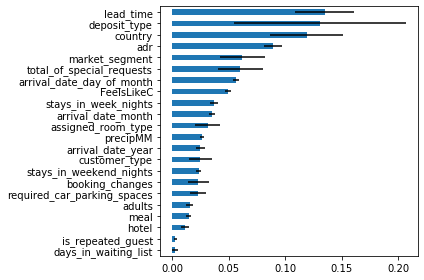

In [99]:
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

df = pd.DataFrame({'feature': train_X.columns, 'importance': importances, 'std': std})
df = df.sort_values('importance')
print(df)
print('')

ax = df.plot(kind='barh', xerr='std', x='feature', legend=False)
ax.set_ylabel('')

plt.tight_layout()
plt.show()

#### <font color=black> Accuracy Score, Precision, Recall, & F1-Score </font>

In [70]:
print(classification_report(valid_y, rf.predict(valid_X)))
print(classificationSummary(valid_y, rf.predict(valid_X)))

              precision    recall  f1-score   support

           0       0.88      0.93      0.90     15697
           1       0.87      0.78      0.82      9272

    accuracy                           0.88     24969
   macro avg       0.88      0.86      0.86     24969
weighted avg       0.88      0.88      0.87     24969

Confusion Matrix (Accuracy 0.8763)

       Prediction
Actual     0     1
     0 14631  1066
     1  2022  7250
None


In [71]:
#testing on unseen data
RF_test=rf.predict(X_test)
print("Accuracy on Unseen Test set is:",accuracy_score(y_test, RF_test))
print()
print("Unseen Test set")
print(classification_report(y_test, RF_test))

Accuracy on Unseen Test set is: 0.8753854779927109

Unseen Test set
              precision    recall  f1-score   support

           0       0.88      0.93      0.90     22468
           1       0.87      0.78      0.82     13202

    accuracy                           0.88     35670
   macro avg       0.87      0.86      0.86     35670
weighted avg       0.88      0.88      0.87     35670



> ##### <font color=red> NOTE </font>
> Random Forest Model generated a higher accuracy score as well as recall. The accuracy score was the highest of the models generated thus far. The benefit of the model is that it is the predicted average of decisions trees on randomly selected data, canceling out any biases; this removes any baises and there is no need for scaling. The model runs a predictions on each tree and selects best solution by voting. It is also a good indicator of feature importance. However, it is a bit difficult to interpret compared to the decision tree, which allows you to follow the path of the tree.

#### <font color=black> **Gradient Boosted Tree** </font>

In [27]:
from sklearn.ensemble import GradientBoostingClassifier

gbm = GradientBoostingClassifier(random_state=0)
gbm.fit(train_X, train_y)
gbm.predict(valid_X[:2])

print("Accuracy on Valid set is :" ,gbm.score(valid_X, valid_y))
print("Accuracy on Unseen Test set is:",accuracy_score(y_test, gbm.predict(X_test)))
print(classification_report(y_test, gbm.predict(X_test)))

Accuracy on Valid set is : 0.8357963875205254
Accuracy on Unseen Test set is: 0.8375105130361649
              precision    recall  f1-score   support

           0       0.85      0.90      0.88     22468
           1       0.82      0.73      0.77     13202

    accuracy                           0.84     35670
   macro avg       0.83      0.81      0.82     35670
weighted avg       0.84      0.84      0.84     35670



### <font color=navy> Keras Neural Network </font>

__Deep learning and Artificial Neural Networks with Keras__

In [231]:
scaler = StandardScaler().fit(train_X)
# Scale the train set
train_X = scaler.transform(train_X)

# Scale the val set
valid_X = scaler.transform(valid_X)

# Scale the test set
X_test = scaler.transform(X_test)

### Model architecture

Initial model testing using hidden layers and epochs with visualization

In [238]:
model = Sequential ()
model.add (Dense (3, activation='relu', input_shape = (22,)))
model.add (Dense(3,activation='relu'))
model.add (Dense(3,activation='relu'))
model.add (Dense (1, activation='sigmoid'))

### Selecting Hyperparameters

In [239]:
model.compile (loss = BinaryCrossentropy(),
               optimizer='rmsprop',
               metrics = ['accuracy'])
model.summary()

Model: "sequential_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_125 (Dense)            (None, 3)                 69        
_________________________________________________________________
dense_126 (Dense)            (None, 3)                 12        
_________________________________________________________________
dense_127 (Dense)            (None, 3)                 12        
_________________________________________________________________
dense_128 (Dense)            (None, 1)                 4         
Total params: 97
Trainable params: 97
Non-trainable params: 0
_________________________________________________________________


## <font color=navy> Training the Model </font>

In [234]:
history = model.fit (train_X, train_y, epochs=10, validation_data= (valid_X, valid_y))

Epoch 1/10
1821/1821 [==============================] - 2s 1ms/step - loss: 0.5918 - accuracy: 0.6816 - val_loss: 0.5152 - val_accuracy: 0.7724
Epoch 2/10
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4779 - accuracy: 0.7899 - val_loss: 0.4608 - val_accuracy: 0.7931
Epoch 3/10
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4446 - accuracy: 0.8003 - val_loss: 0.4392 - val_accuracy: 0.7982
Epoch 4/10
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4291 - accuracy: 0.8018 - val_loss: 0.4270 - val_accuracy: 0.8018
Epoch 5/10
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4209 - accuracy: 0.8037 - val_loss: 0.4206 - val_accuracy: 0.8032
Epoch 6/10
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4166 - accuracy: 0.8038 - val_loss: 0.4198 - val_accuracy: 0.8021
Epoch 7/10
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4144 - accuracy: 0.8043 - val_loss: 0.4153 - val_accuracy:

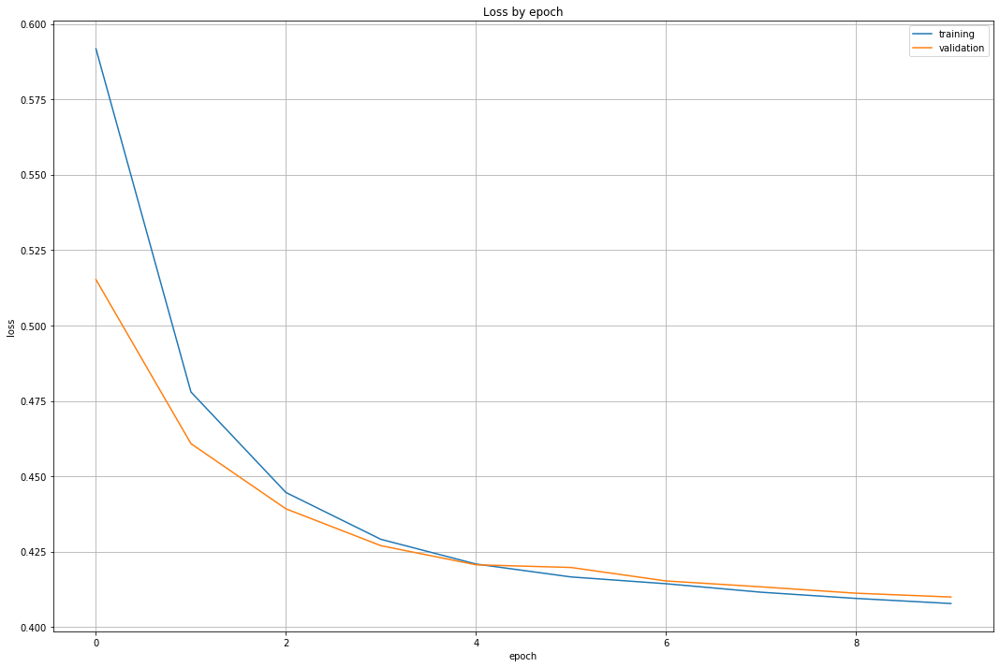

In [235]:
plt.rcParams ['figure.figsize'] = [18, 12]
v_loss = history.history ['val_loss']
loss = history.history ['loss']
v_acc = history.history ['val_accuracy']
acc = history.history ['accuracy']
x = range (len(loss))

plt.plot (x, loss, x, v_loss)
plt.title ('Loss by epoch')
plt.legend (['training', 'validation'])
plt.xlabel ('epoch')
plt.ylabel ('loss')
plt.grid()
plt.show()

> ##### <font color=red> NOTE: </font>
> Initial test shows the model is doing what we want it. Validation is improving slower than training but still improving.
Lets test for more epochs.

In [240]:
history = model.fit (train_X, train_y, epochs=100, validation_data= (valid_X, valid_y))

Epoch 1/100
1821/1821 [==============================] - 2s 1ms/step - loss: 0.5701 - accuracy: 0.7262 - val_loss: 0.4875 - val_accuracy: 0.7769
Epoch 2/100
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4616 - accuracy: 0.7886 - val_loss: 0.4523 - val_accuracy: 0.7885
Epoch 3/100
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4444 - accuracy: 0.7953 - val_loss: 0.4409 - val_accuracy: 0.7921
Epoch 4/100
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4347 - accuracy: 0.7976 - val_loss: 0.4316 - val_accuracy: 0.7969
Epoch 5/100
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4272 - accuracy: 0.8016 - val_loss: 0.4258 - val_accuracy: 0.8017
Epoch 6/100
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4229 - accuracy: 0.8042 - val_loss: 0.4232 - val_accuracy: 0.8030
Epoch 7/100
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4205 - accuracy: 0.8048 - val_loss: 0.4216 - val_ac

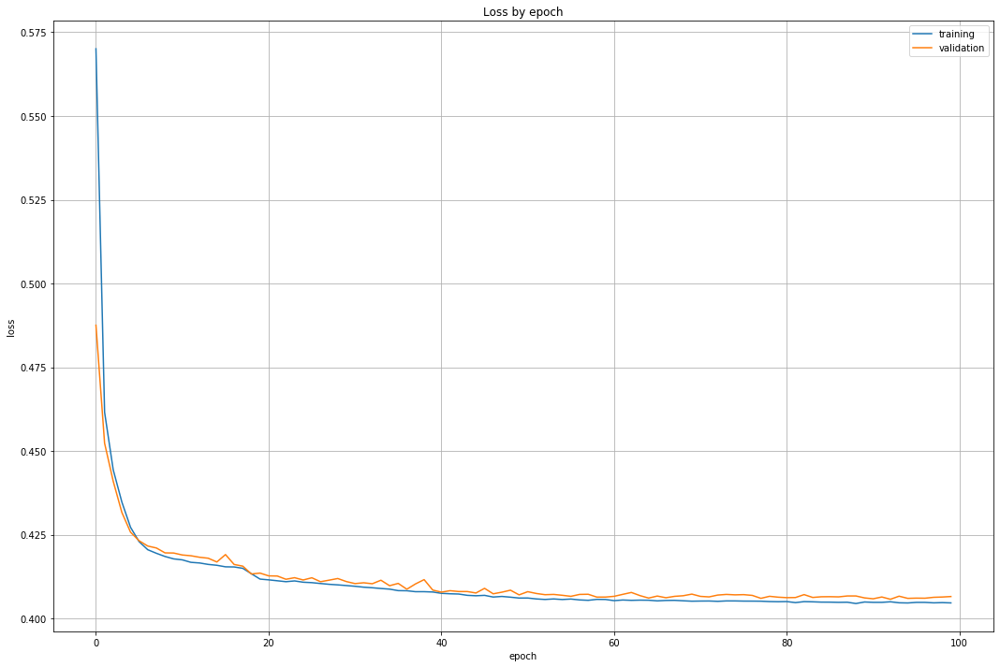

In [241]:
plt.rcParams ['figure.figsize'] = [18, 12]
v_loss = history.history ['val_loss']
loss = history.history ['loss']
v_acc = history.history ['val_accuracy']
acc = history.history ['accuracy']
x = range (len(loss))

plt.plot (x, loss, x, v_loss)
plt.title ('Loss by epoch')
plt.legend (['training', 'validation'])
plt.xlabel ('epoch')
plt.ylabel ('loss')
plt.grid()
plt.show()

> ##### <font color=red> NOTE: </font>
> Validation is overfitted at about 5 epochs. Need to train and observe the model again with different parameters.

In [242]:
score1 = model.evaluate(valid_X, valid_y)
score1

781/781 [==============================] - 0s 627us/step - loss: 0.4065 - accuracy: 0.8042


[0.4065208435058594, 0.8042372465133667]

In [243]:
Keras_pred1 = model.predict_classes(valid_X)

print("Accuracy on val is:",accuracy_score(valid_y, Keras_pred1))
print(classification_report(valid_y, Keras_pred1))

Accuracy on val is: 0.8042372541952021
              precision    recall  f1-score   support

           0       0.82      0.89      0.85     15697
           1       0.78      0.66      0.71      9272

    accuracy                           0.80     24969
   macro avg       0.80      0.77      0.78     24969
weighted avg       0.80      0.80      0.80     24969



__Increasing hidden layers__

In [263]:
model = Sequential ()
model.add (Dense (8, activation='relu', input_shape = (22,)))
model.add (Dense(8,activation='relu'))
model.add (Dense(2,activation='relu'))
model.add (Dense (1, activation='sigmoid'))

In [264]:
model.compile (loss = BinaryCrossentropy(),
               optimizer='rmsprop',
               metrics = ['accuracy'])
model.summary()

Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_147 (Dense)            (None, 8)                 184       
_________________________________________________________________
dense_148 (Dense)            (None, 8)                 72        
_________________________________________________________________
dense_149 (Dense)            (None, 2)                 18        
_________________________________________________________________
dense_150 (Dense)            (None, 1)                 3         
Total params: 277
Trainable params: 277
Non-trainable params: 0
_________________________________________________________________


In [265]:
history = model.fit (train_X, train_y, epochs=50, validation_data= (valid_X, valid_y))

Epoch 1/50
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4802 - accuracy: 0.7678 - val_loss: 0.4279 - val_accuracy: 0.7933
Epoch 2/50
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4162 - accuracy: 0.8019 - val_loss: 0.4104 - val_accuracy: 0.8064
Epoch 3/50
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4044 - accuracy: 0.8073 - val_loss: 0.4009 - val_accuracy: 0.8086
Epoch 4/50
1821/1821 [==============================] - 2s 1ms/step - loss: 0.3956 - accuracy: 0.8112 - val_loss: 0.3933 - val_accuracy: 0.8136
Epoch 5/50
1821/1821 [==============================] - 2s 1ms/step - loss: 0.3895 - accuracy: 0.8147 - val_loss: 0.3881 - val_accuracy: 0.8141
Epoch 6/50
1821/1821 [==============================] - 2s 1ms/step - loss: 0.3851 - accuracy: 0.8164 - val_loss: 0.3858 - val_accuracy: 0.8161
Epoch 7/50
1821/1821 [==============================] - 2s 1ms/step - loss: 0.3822 - accuracy: 0.8184 - val_loss: 0.3844 - val_accuracy:

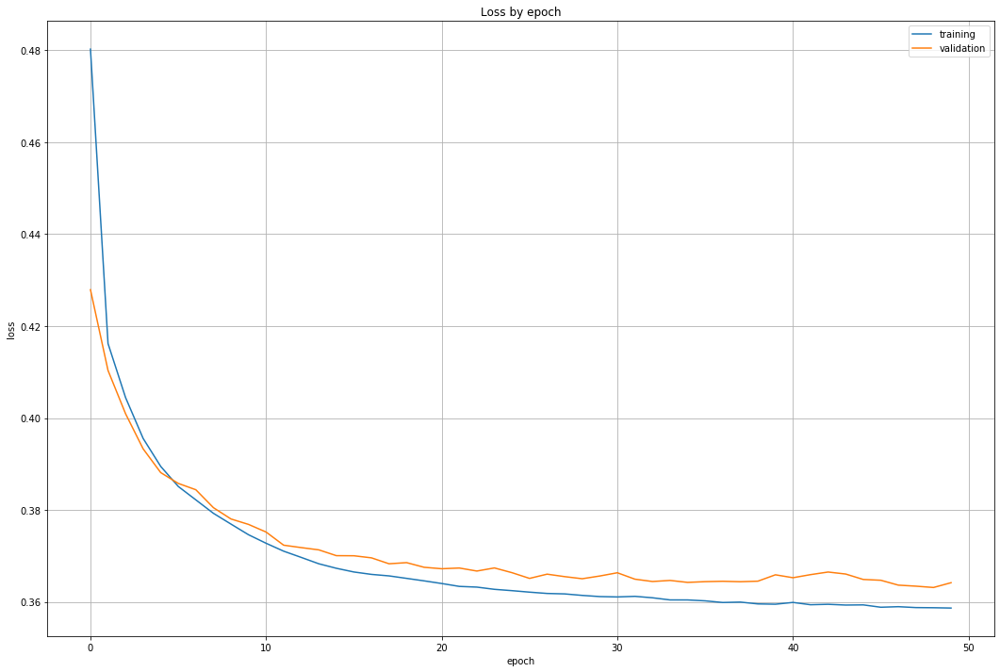

In [266]:
plt.rcParams ['figure.figsize'] = [18, 12]
v_loss = history.history ['val_loss']
loss = history.history ['loss']
v_acc = history.history ['val_accuracy']
acc = history.history ['accuracy']
x = range (len(loss))

plt.plot (x, loss, x, v_loss)
plt.title ('Loss by epoch')
plt.legend (['training', 'validation'])
plt.xlabel ('epoch')
plt.ylabel ('loss')
plt.grid()
plt.show()

> ##### <font color=red> NOTE: </font>
> Model again seems to overfit, this time at about 15 epochs. This is probably due to the simple complexity of the dataset. 
Will test for 200 epoch for a better look.

In [267]:
score2 = model.evaluate(valid_X, valid_y)
score2

781/781 [==============================] - 0s 619us/step - loss: 0.3642 - accuracy: 0.8264


[0.3641970753669739, 0.8263847231864929]

In [268]:
Keras_pred2 = model.predict_classes(valid_X)

print("Accuracy on val is:",accuracy_score(valid_y, Keras_pred2))
print(classification_report(valid_y, Keras_pred2))

Accuracy on val is: 0.826384717049141
              precision    recall  f1-score   support

           0       0.85      0.88      0.86     15697
           1       0.79      0.73      0.76      9272

    accuracy                           0.83     24969
   macro avg       0.82      0.81      0.81     24969
weighted avg       0.82      0.83      0.82     24969



In [202]:
model = Sequential ()
model.add (Dense (8, activation='relu', input_shape = (22,)))
model.add (Dense(8,activation='relu'))
model.add (Dense(2,activation='relu'))
model.add (Dense (1, activation='sigmoid'))

In [203]:
model.compile (loss = BinaryCrossentropy(),
               optimizer='rmsprop',
               metrics = ['accuracy'])
model.summary()

Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_85 (Dense)             (None, 8)                 184       
_________________________________________________________________
dense_86 (Dense)             (None, 8)                 72        
_________________________________________________________________
dense_87 (Dense)             (None, 2)                 18        
_________________________________________________________________
dense_88 (Dense)             (None, 1)                 3         
Total params: 277
Trainable params: 277
Non-trainable params: 0
_________________________________________________________________


In [204]:
history = model.fit (train_X, train_y, epochs=200, validation_data= (valid_X, valid_y))

Epoch 1/200
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4725 - accuracy: 0.7635 - val_loss: 0.4242 - val_accuracy: 0.7979
Epoch 2/200
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4147 - accuracy: 0.8023 - val_loss: 0.4080 - val_accuracy: 0.8062
Epoch 3/200
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4028 - accuracy: 0.8080 - val_loss: 0.3996 - val_accuracy: 0.8099
Epoch 4/200
1821/1821 [==============================] - 2s 1ms/step - loss: 0.3950 - accuracy: 0.8123 - val_loss: 0.3934 - val_accuracy: 0.8119
Epoch 5/200
1821/1821 [==============================] - 2s 1ms/step - loss: 0.3899 - accuracy: 0.8146 - val_loss: 0.3913 - val_accuracy: 0.8140
Epoch 6/200
1821/1821 [==============================] - 2s 1ms/step - loss: 0.3877 - accuracy: 0.8150 - val_loss: 0.3871 - val_accuracy: 0.8168
Epoch 7/200
1821/1821 [==============================] - 2s 1ms/step - loss: 0.3853 - accuracy: 0.8164 - val_loss: 0.3870 - val_ac

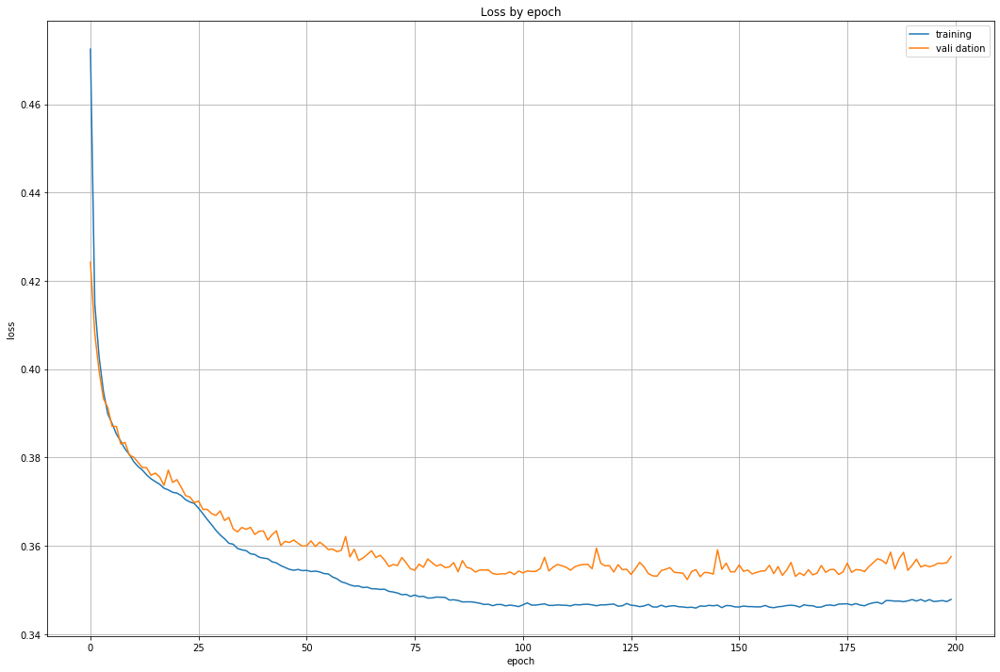

In [205]:
plt.rcParams ['figure.figsize'] = [18, 12]
v_loss = history.history ['val_loss']
loss = history.history ['loss']
v_acc = history.history ['val_accuracy']
acc = history.history ['accuracy']
x = range (len(loss))

plt.plot (x, loss, x, v_loss)
plt.title ('Loss by epoch')
plt.legend (['training', 'vali dation'])
plt.xlabel ('epoch')
plt.ylabel ('loss')
plt.grid()
plt.show()

> ##### <font color=red> NOTE: </font>
> Based on this attempt, there is too much variance between training and validation set. Anything above 25 epochs results in data overfitting.  The model does have a performance accuracy of 83% but because it is overfitted it is not the model we want.  <br>
 

In [207]:
score3 = model.evaluate(valid_X, valid_y)
score3

781/781 [==============================] - 0s 625us/step - loss: 0.3576 - accuracy: 0.8312


[0.3575924038887024, 0.8311907052993774]

In [208]:
Keras_pred3 = model.predict_classes(valid_X)

print("Accuracy on val is:",accuracy_score(valid_y, Keras_pred3))
print(classification_report(valid_y, Keras_pred3))

Accuracy on val is: 0.8311906764387841
              precision    recall  f1-score   support

           0       0.85      0.89      0.87     15697
           1       0.79      0.74      0.76      9272

    accuracy                           0.83     24969
   macro avg       0.82      0.81      0.82     24969
weighted avg       0.83      0.83      0.83     24969



>In this case, the model is simply not complex enough to capture the dynamics of the <br>
>problem, and so we need to create a more powerful model.

In [248]:
model = Sequential ()
model.add (Dense (3, activation='relu', input_shape = (22,)))
model.add (Dense(3,activation='relu'))
model.add (Dense(3,activation='relu'))
model.add (Dense(3,activation='relu'))
model.add (Dense(3,activation='relu'))
model.add (Dense (1, activation='sigmoid'))

In [249]:
model.compile (loss = BinaryCrossentropy(),
               optimizer='rmsprop',
               metrics = ['accuracy'])
model.summary()

Model: "sequential_29"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_135 (Dense)            (None, 3)                 69        
_________________________________________________________________
dense_136 (Dense)            (None, 3)                 12        
_________________________________________________________________
dense_137 (Dense)            (None, 3)                 12        
_________________________________________________________________
dense_138 (Dense)            (None, 3)                 12        
_________________________________________________________________
dense_139 (Dense)            (None, 3)                 12        
_________________________________________________________________
dense_140 (Dense)            (None, 1)                 4         
Total params: 121
Trainable params: 121
Non-trainable params: 0
_______________________________________________________

In [160]:
history = model.fit (train_X, train_y, epochs=50, validation_data= (valid_X, valid_y))

Epoch 1/50
1821/1821 [==============================] - 2s 1ms/step - loss: 0.5661 - accuracy: 0.7257 - val_loss: 0.5018 - val_accuracy: 0.7702
Epoch 2/50
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4743 - accuracy: 0.7824 - val_loss: 0.4623 - val_accuracy: 0.7849
Epoch 3/50
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4466 - accuracy: 0.7948 - val_loss: 0.4430 - val_accuracy: 0.7917
Epoch 4/50
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4328 - accuracy: 0.7983 - val_loss: 0.4324 - val_accuracy: 0.7942
Epoch 5/50
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4233 - accuracy: 0.7998 - val_loss: 0.4216 - val_accuracy: 0.7994
Epoch 6/50
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4160 - accuracy: 0.8011 - val_loss: 0.4138 - val_accuracy: 0.8016
Epoch 7/50
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4089 - accuracy: 0.8027 - val_loss: 0.4057 - val_accuracy:

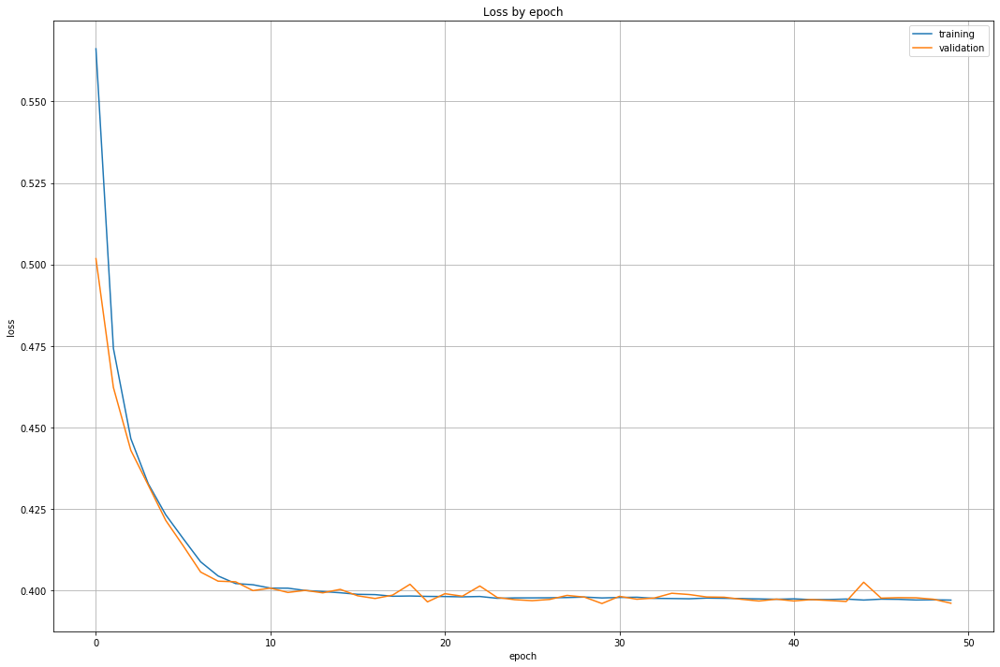

In [161]:
plt.rcParams ['figure.figsize'] = [18, 12]
v_loss = history.history ['val_loss']
loss = history.history ['loss']
v_acc = history.history ['val_accuracy']
acc = history.history ['accuracy']
x = range (len(loss))

plt.plot (x, loss, x, v_loss)
plt.title ('Loss by epoch')
plt.legend (['training', 'validation'])
plt.xlabel ('epoch')
plt.ylabel ('loss')
plt.grid()
plt.show()

> ##### <font color=red> NOTE: </font>
> Much better. Lets test one last, increasing epochs, to be certain that the model maintains form.

In [162]:
score4 = model.evaluate(valid_X, valid_y)
score4

781/781 [==============================] - 0s 637us/step - loss: 0.3962 - accuracy: 0.8068


[0.39617860317230225, 0.8067603707313538]

In [163]:
Keras_pred4 = model.predict_classes(valid_X)

print("Accuracy on val is:",accuracy_score(valid_y, Keras_pred4))
print(classification_report(valid_y, Keras_pred4))

Accuracy on val is: 0.8067603828747647
              precision    recall  f1-score   support

           0       0.81      0.90      0.85     15697
           1       0.79      0.65      0.71      9272

    accuracy                           0.81     24969
   macro avg       0.80      0.77      0.78     24969
weighted avg       0.81      0.81      0.80     24969



In [164]:
results = model.evaluate (X_test, y_test)
results

1115/1115 [==============================] - 1s 627us/step - loss: 0.4007 - accuracy: 0.8036


[0.40069499611854553, 0.8035884499549866]

In [255]:
model = Sequential ()
model.add (Dense (3, activation='relu', input_shape = (22,)))
model.add (Dense(3,activation='relu'))
model.add (Dense(3,activation='relu'))
model.add (Dense(3,activation='relu'))
model.add (Dense(3,activation='relu'))
model.add (Dense (1, activation='sigmoid'))

In [256]:
model.compile (loss = BinaryCrossentropy(),
               optimizer='rmsprop',
               metrics = ['accuracy'])
model.summary()

Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_141 (Dense)            (None, 3)                 69        
_________________________________________________________________
dense_142 (Dense)            (None, 3)                 12        
_________________________________________________________________
dense_143 (Dense)            (None, 3)                 12        
_________________________________________________________________
dense_144 (Dense)            (None, 3)                 12        
_________________________________________________________________
dense_145 (Dense)            (None, 3)                 12        
_________________________________________________________________
dense_146 (Dense)            (None, 1)                 4         
Total params: 121
Trainable params: 121
Non-trainable params: 0
_______________________________________________________

In [257]:
history = model.fit (train_X, train_y, epochs=1000, validation_data= (valid_X, valid_y))

Epoch 1/1000
1821/1821 [==============================] - 2s 1ms/step - loss: 0.5693 - accuracy: 0.7099 - val_loss: 0.4981 - val_accuracy: 0.7753
Epoch 2/1000
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4725 - accuracy: 0.7839 - val_loss: 0.4591 - val_accuracy: 0.7899
Epoch 3/1000
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4484 - accuracy: 0.7947 - val_loss: 0.4441 - val_accuracy: 0.7934
Epoch 4/1000
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4383 - accuracy: 0.7964 - val_loss: 0.4368 - val_accuracy: 0.7952
Epoch 5/1000
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4323 - accuracy: 0.7973 - val_loss: 0.4321 - val_accuracy: 0.7925
Epoch 6/1000
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4286 - accuracy: 0.7982 - val_loss: 0.4276 - val_accuracy: 0.7974
Epoch 7/1000
1821/1821 [==============================] - 2s 1ms/step - loss: 0.4261 - accuracy: 0.7993 - val_loss: 0.4254 -

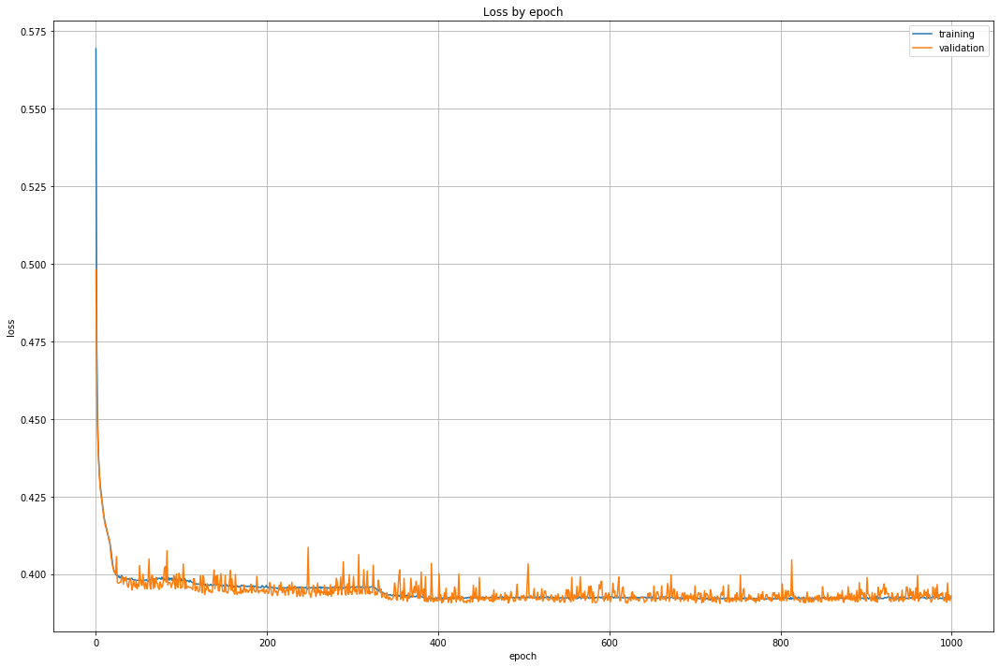

In [258]:
plt.rcParams ['figure.figsize'] = [18, 12]
v_loss = history.history ['val_loss']
loss = history.history ['loss']
v_acc = history.history ['val_accuracy']
acc = history.history ['accuracy']
x = range (len(loss))

plt.plot (x, loss, x, v_loss)
plt.title ('Loss by epoch')
plt.legend (['training', 'validation'])
plt.xlabel ('epoch')
plt.ylabel ('loss')
plt.grid()
plt.show()

> ##### <font color=red> NOTE: </font>
> The model maintained it's variance with a 1000 epochs, it is the model we want to use.

In [259]:
score6 = model.evaluate(valid_X, valid_y)
score6

781/781 [==============================] - 0s 635us/step - loss: 0.3929 - accuracy: 0.8094


[0.3929455876350403, 0.809363603591919]

In [260]:
Keras_pred6 = model.predict_classes(valid_X)

print("Accuracy on val is:",accuracy_score(valid_y, Keras_pred6))
print(classification_report(valid_y, Keras_pred6))

Accuracy on val is: 0.8093636108774881
              precision    recall  f1-score   support

           0       0.81      0.91      0.86     15697
           1       0.81      0.64      0.71      9272

    accuracy                           0.81     24969
   macro avg       0.81      0.77      0.78     24969
weighted avg       0.81      0.81      0.80     24969



In [261]:
results = model.evaluate (X_test, y_test)
results

1115/1115 [==============================] - 1s 624us/step - loss: 0.3956 - accuracy: 0.8078


[0.395635724067688, 0.8078497052192688]

> ##### <font color=red> NOTE: </font>
>**The model of best fit only produced an accuracy of 81% with a recall of 64% while preventing overfitting; high variance between training and testing sets. This is likely due to the simple complexity of the data set for a deep learning algorithm to better understand the data and make more accurate predictions.**

## <font color=navy> Ensemble and Stacking </font>

In [48]:
from sklearn.ensemble import VotingClassifier, GradientBoostingClassifier, StackingClassifier, RandomForestClassifier
import mlxtend
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline


estimators = [
('rf', RandomForestClassifier(n_estimators=500, random_state=1)),
('xgb', XGBClassifier())
]

clf = StackingClassifier(
estimators=estimators, final_estimator=LogisticRegression()
)

clf.fit(train_X, train_y).score(valid_X, valid_y)

print("Accuracy:",metrics.accuracy_score(valid_y, clf.predict(valid_X)))
print("precision score: ", precision_score(valid_y,clf.predict(valid_X)))
print("recall score: ", recall_score(valid_y,clf.predict(valid_X)))
print("f1-score: ", f1_score(valid_y,clf.predict(valid_X)))

Accuracy: 0.8780087308262245
precision score:  0.8884726401768716
recall score:  0.921641077912977
f1-score:  0.9047529706066291


> ##### <font color=red> NOTE: </font>
> Stacking slightly imporved accuracy from **87.56** to **87.8** when compared to random forest only. We used Random forest and XGBoost, final estimator was logistic regression

In [30]:
estimators = [
('rf', RandomForestClassifier(n_estimators=500, random_state=1)),
('knn', KNeighborsClassifier(n_neighbors = 8))
]

clf = StackingClassifier(
estimators=estimators, final_estimator=LogisticRegression()
)

clf.fit(train_X, train_y).score(valid_X, valid_y)

print("Accuracy:",metrics.accuracy_score(valid_y, clf.predict(valid_X)))
print("precision score: ", precision_score(valid_y,clf.predict(valid_X)))
print("recall score: ", recall_score(valid_y,clf.predict(valid_X)))
print("f1-score: ", f1_score(valid_y,clf.predict(valid_X)))


Accuracy: 0.8757659497777244
precision score:  0.8604814208927319
recall score:  0.7942191544434858
f1-score:  0.8260235558048233


> ##### <font color=red> NOTE: </font>
> Same accuracy as last model but recall dropped significantly. (Used Random forest and KNN, final estimator was logistic regression)

In [31]:
estimators = [
('rf', RandomForestClassifier(n_estimators=500, random_state=1)),
('xgb', XGBClassifier()), ('gbt', GradientBoostingClassifier())
]

clf = StackingClassifier(
estimators=estimators, final_estimator=LogisticRegression()
)

clf.fit(train_X, train_y).score(valid_X, valid_y)

print("Accuracy:",metrics.accuracy_score(valid_y, clf.predict(valid_X)))
print("precision score: ", precision_score(valid_y,clf.predict(valid_X)))
print("recall score: ", recall_score(valid_y,clf.predict(valid_X)))
print("f1-score: ", f1_score(valid_y,clf.predict(valid_X)))

Accuracy: 0.8782490287957067
precision score:  0.8592344938897856
recall score:  0.8038179465056083
f1-score:  0.8306029198707233


> ##### <font color=red> NOTE: </font>
> Accuracy slightly improved but recall dropped compared to the first stacking model. (Used Random forest XGBoost, and gradient boosted trees, final estimator was logistic regression)

In [33]:
estimators = [
('rf', RandomForestClassifier(n_estimators=500, random_state=1)),
('xgb', XGBClassifier()),('gbt', GradientBoostingClassifier())
]

clf = StackingClassifier(
estimators=estimators, final_estimator=GaussianNB()
)

clf.fit(train_X, train_y).score(valid_X, valid_y)

print("Accuracy:",metrics.accuracy_score(valid_y, clf.predict(valid_X)))
print("precision score: ", precision_score(valid_y,clf.predict(valid_X)))
print("recall score: ", recall_score(valid_y,clf.predict(valid_X)))
print("f1-score: ", f1_score(valid_y,clf.predict(valid_X)))

Accuracy: 0.8705194441106973
precision score:  0.8280995327610562
recall score:  0.8219370146678171
f1-score:  0.8250067658998647


> ##### <font color=red> NOTE: </font>
> Both accuracy and recall dropped compared to the first stacking model by using naive bayes as the final estimator (Used Random forest XGBoost, and gradient boosted trees)

## Random Forest

We evaluate the performance of our baseline Model on the testing data and optimize for performance <br>
That is completely unseen

### Scaling

In [112]:
scaler = StandardScaler().fit(train_X)
# Scale the train set
train_X = scaler.transform(train_X)

# Scale the val set
valid_X = scaler.transform(valid_X)

# Scale the test set
X_test = scaler.transform(X_test)

### Selecting Hyperparameters

In [113]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

classifier = RandomForestClassifier(random_state=0)

grid_param = {
    'n_estimators': [100, 300, 500, 800, 1000],
    'criterion': ['gini', 'entropy'],
    'bootstrap': [True, False]
}

grid = GridSearchCV(estimator=classifier,
                     param_grid=grid_param,
                     scoring='recall',
                     cv=5,
                     n_jobs=-1)

grid.fit(train_X, train_y)

print(grid.best_params_)

print(grid.best_score_)

{'bootstrap': False, 'criterion': 'entropy', 'n_estimators': 1000}
0.7821395829875254


In [114]:
print("precision score: ", precision_score(valid_y,grid.predict(valid_X)))
print("recall score: ", recall_score(valid_y,grid.predict(valid_X)))
print("f1-score: ", f1_score(valid_y,grid.predict(valid_X)))

precision score:  0.8643305315496626
recall score:  0.7874245038826575
f1-score:  0.8240871381003443


In [116]:
rf = RandomForestClassifier(n_estimators=1000, random_state=1)
rf.fit(train_X, train_y)

# prediction on test set
y_pred_rf=rf.predict(valid_X)

# Model Accuracy, how often is the classifier correct?
print("Valid set")
print()
print("Accuracy:",metrics.accuracy_score(valid_y, y_pred_rf))
print("precision score: ", precision_score(valid_y, y_pred_rf))
print("recall score: ", recall_score(valid_y, y_pred_rf))
print("f1-score: ", f1_score(valid_y, y_pred_rf))

Valid set

Accuracy: 0.8760062477472066
precision score:  0.8710646479211728
recall score:  0.7818162208800691
f1-score:  0.8240309196316927


Hyperparameter test optimized the n_estimators to 1000 from our baseline test of 500. The accuracy score improved by about 0.1%.

### AUC

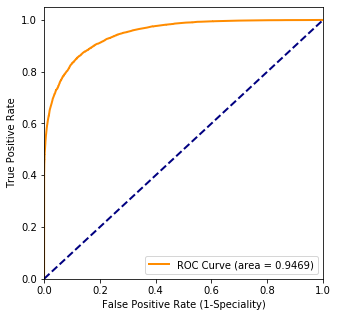

In [117]:
from sklearn.metrics import roc_curve, auc

def roc_graph(rf, valid_y,valid_X):
    fpr,tpr,_=roc_curve(valid_y, rf.predict_proba(valid_X)[:,1])
    roc_auc= auc(fpr, tpr)
    
    plt.figure(figsize=[5,5])
    plt.plot(fpr, tpr, color='darkorange', lw=2, label = 'ROC Curve (area = %0.4f)' % roc_auc)
    plt.plot([0,1],[0,1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate (1-Speciality)')
    plt.ylabel('True Positive Rate')
    plt.legend(loc="lower right")
    plt.show()
    
roc_graph(rf, valid_y,valid_X)

> ##### <font color=red> NOTE: </font>
> The larger the area under the curve the better the model, with 1 or 100% as a best case scenario. The Random Forest Model scored a **.95** or **95%** which shows it has a strong reliability in predicting hotel cancelations.

### Testing on Unseen Data

In [118]:
RF_test=rf.predict(X_test)
print("Unseen Test set")
print()
print("Accuracy:", accuracy_score(y_test, RF_test))
print("precision score: ", precision_score(y_test, RF_test))
print("recall score: ", recall_score(y_test, RF_test))
print("f1-score: ", f1_score(y_test, RF_test))

Unseen Test set

Accuracy: 0.8752453041771797
precision score:  0.8694697737250928
recall score:  0.7800333282835934
f1-score:  0.8223269184700152


> ##### <font color=red> NOTE: </font>
> The Random Forest Model performed slightly better on the validation-set than the test-set, with both accuracy and recall *difference* of about **0.1%**. All though the accuracy score was strong, recall of 78% suggests that the model would not be a reliable predictor in preveting revenue loss for the hotels given the number of false negatives generated.n

# Model acceptance: Stack classifier using random forest, and XG Boost with logistic regression as the final estimator. 
It has an accuracy of about 87.8% and it has the highest recall score of about 92.2%. For our business problem it is important to minimize false negatives. 

### A. What attributes were kept, which ones were dropped and why?

<li> The initial correlation matrix illustrated showed that 'reserved_room_type' and 'assigned_room_type' had a high correlation of 0.82. </li><br>

<li>To prevent multicollinearity or the linear prediction of one variable based on other features with high accuracy, we automated a threshold in our model that removed any features with correlations of 0.8 and higher. </li><br>

<li>Since each correlation coefficient occurs twice in the matrix, we created a boolean mask with <font color=green> *True* </font>values and dropped all columns that met the logic; this resulted in 23 columns and allowed us to train our model with low correlated features.<br><br></li>

### B. Important variables and what they represent

<li> Country of customer: </li>
<p style="margin-left: 40px">Based on initial data observations, the customer's vicinity to the hotel had a major impact on the dataset; roughly 27,000 of the 44,000 recorded cancelations were from bookings made by customers living in Portugal. <br></p>
<li> Lead time of booking: </li>
<p  style="margin-left: 40px">Lead time showed that recent reservations were the most likely to be canceled; 430 cancelations were made on the same day as the booking, roughly 30% canceled within 60 days.<br></p>
<li> Deposit type: </li>
<p  style="margin-left: 40px">30,000 of the cancelations (or 70% of the total) did not require a deposit. <br></p>
<li> ADR* (average daily rate): </li>
<p  style="margin-left: 40px"> Showed that most cancellations occurred where the price per stay was about $100 or less. <br></p>

###### <p  style="margin-left: 40px"> *calculated by dividing the sum of lodging transactions by the total number nights per stay. </p><br><br>

### C. Interpretation of the results of different models. 
#### Tradeoffs between models

<ol>
  <li>We used nine different models and the highest accuracy score was produced by random forest, followed by XGBoost. However, for our business problem, we are focusing on the recall measure as it is more important to minimize false negatives.<br><br>
  <li>The highest recall score was also using random forest followed by XGBoost.<br><br>
  <li>We then used ensemble and stacking. We tried various combinations and the best results were generated when we used random forest, and XGBoost with the final estimator being Logistic Regression. The accuracy was on par with the others (87.8%) but the recall and f-1 measures were over 90%.</li>
</ol>

### D. Insights of the overall problem and recommendations

<ol>
    <li>The high rate of cancellations is likely due to no deposit policies. Management should set more rigid cancellation policies to reduce them.<br><br>
    <li>Management should give incentives to book outside of the summer months which are the busiest (August & July).<br><br>
    <li>They can have flexible policies during the summer as demand is very high.<br><br>
    <li>Management should focus more on the resort when giving incentives. The city hotel prices stay quite stable throughout the year, but resort hotel prices tend to go up during the peak months.<br><br>
    <li> Most of the guests seem to visit from Europe, more incentives should be given to guests visiting from outside of Europe to increase revenue. </li>
</ol>

<li>References for visuals: https://www.kaggle.com/marcuswingen/eda-of-bookings-and-ml-to-predict-cancelations<br><br>